HABIB Mohamed, LANNUZEL Tristan, TACHET Dorian, THOMAS Etienne 

Etude d'un graphe representant les aeroports européens et leur lignes interieures. Basé sur le jeu de donné : https://ec.europa.eu/eurostat/web/transport/data/database (onglet avia_par)

<h2> I - Importation des librairies : </h2>

In [ ]:
import community # you need 'python-louvain' package
import networkx as nx # you need 'networkx' package
import matplotlib.pyplot as plt # you need 'matplotlib' package
import pandas as pd
import scipy as sp # you need 'scipy' package
import sklearn
from sklearn.cluster import SpectralClustering # you need 'scikit-learn' package
import numpy as np # you need 'numpy' package

import string
import random
import copy
import csv


<h2> II - Récupération et mise en forme des données : </h2>

In [ ]:
names = ('depart,arrive,trafic').split(',')

data = pd.read_csv('data/finall.csv', names=names,sep='\t', header=None, na_values=[':'])
# recuperer le fichier finall.csv dans le dossier data

In [47]:
pays_eu = ["BE_", "BG_","CZ_", "DK_", "DE_", "EE_", "IE_", "EL_", "ES_", "FR_", "HR_", "IT_", "CY_", "LV_", "LT_", "LU_", "HU_", "MT_", "NL_", "AT_", "PL_", "PT_", "RO_", "SI_", "SK_", "FI_", "SE_", "UK_", "IS_", "NO_", "CH_", "ME_", "MK_", "TR_", "RS_"]

column_names = ['depart', 'arrive', 'trafic']
routes = pd.DataFrame(columns = column_names)
poids = []

#print(len(routes))
for index, route in data.iterrows():
  for pays in pays_eu :
    #print('#Comparaison : ', pays, " <=> ", route['arrive'])
    if pays in str(route['arrive']):
      #routes.append(str(route['arrive']))
      routes = routes.append(route, ignore_index=True);
      poids.append([route['depart'],route['arrive'],route['trafic']])
      #print("-", route['depart'], "vers", route['arrive'], "ajouté")
      break;

<h2> III - Description et affichage du graphe : </h2>

In [48]:
edges = routes[['depart','arrive']].values
g = nx.from_edgelist(edges)
print("Nombre de noeud du graphe :", len(g.nodes()), "\nNombre d'arrete du graphe :", len(g.edges()))


Nombre de noeud du graphe : 454 
Nombre d'arrete du graphe : 2320


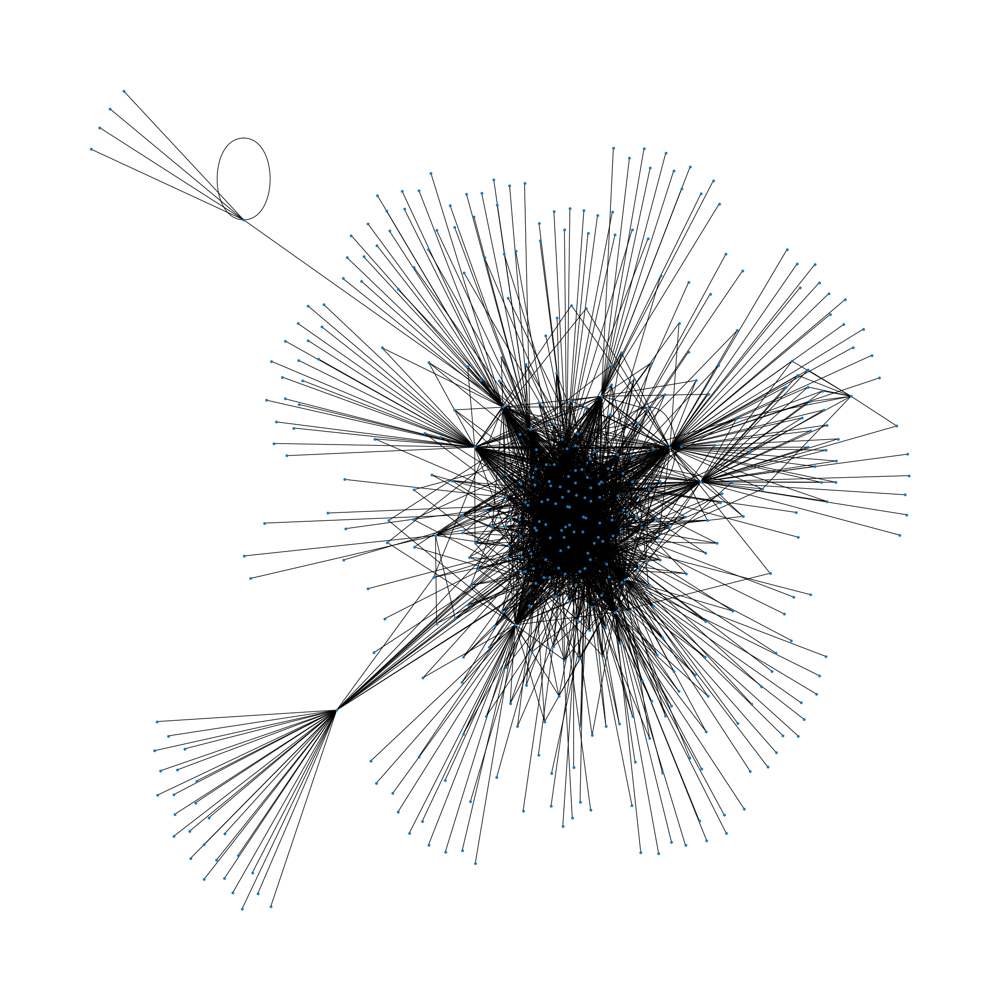

In [49]:
plt.rcParams["figure.figsize"]=[20,20]
nx.draw(g,pos=nx.spring_layout(g),node_size=10)

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(100,100))
nx.draw_networkx(g, ax=ax, node_size=10,
                 font_size=20, alpha=.5,
                 width=.5, font_color= "red")
ax.set_axis_off()

<h2> IV - Création de graphes génératifs : </h2>

In [51]:
###### CREATION D'UN BARABASI CORRESPONDANT #############
gBAR=nx.barabasi_albert_graph(len(g.edges()),len(g.nodes()))
#nx.draw(gBAR,pos=nx.spring_layout(gBAR),node_size=200)
#plt.show()

In [52]:
###### CREATION D'UN ERDO-SHRENI CORRESPONDANT #######
gERDO=nx.gnm_random_graph(len(g.nodes()),len(g.edges()))
#nx.draw(gERDO,pos=nx.spring_layout(gERDO),node_size=200)
#plt.show()

In [53]:
######### CREATION D'UN WATTS STROGATZ ####################### 
# (faire varier k jusqu'au bon nb d'arrette puis faire varier p jusqu'a ce qu'on ai la bonne densité)
# k = 11  correspond a un graphe avec 97.84% des arretes du graphe initiale
# p = ????? au dessus de p=0.4 la distribution des degres ne varie pas significativement et la moyenne reste centré sur ~10
gWATTS = nx.watts_strogatz_graph(n=len(g.nodes()),k=11,p=0.6)
#nx.draw(gWATTS,pos=nx.circular_layout(gWATTS),node_size=200)
#plt.show()

<h2> V - Comparaison avec les graphes génératifs : </h2>
    <h4> A - 4 Propriétés classiques : </h4>
    1_ densité_

In [54]:
nx.density(g)

0.02256128988340092

In [55]:
nx.density(gBAR)

0.31492617210153007

In [56]:
nx.density(gERDO)

0.02256128988340092

In [57]:
nx.density(gWATTS)

0.02207505518763797

2_clustering elevé_

In [58]:
nx.average_clustering(g)

0.3842427922991571

In [59]:
nx.average_clustering(gERDO)

0.02180805490722335

In [60]:
nx.average_clustering(gBAR)

In [ ]:
nx.average_clustering(gWATTS)

3_ Heterogeneité_ 
(Voir le graphe de distribution des degrès)

In [ ]:
degree_sequence = [d for n, d in g.degree()]
plt.figure(figsize=(8,8))
plt.hist(degree_sequence, 30);

In [ ]:
degree_sequenceERDO = [d for n, d in gERDO.degree()] #### mesure distrib degres du graphe ERDO
plt.figure(figsize=(8,8))
plt.hist(degree_sequenceERDO, 30);

In [ ]:
degree_sequenceBAR = [d for n, d in gBAR.degree()] #### mesure distrib degres du graphe BARABASI
plt.figure(figsize=(8,8))
plt.hist(degree_sequenceBAR, 30);

In [ ]:
degree_sequenceWATTS = [d for n, d in gWATTS.degree()]  #### mesure distrib degres du graphe WATTS-STROGATZ
plt.figure(figsize=(8,8))
plt.hist(degree_sequenceWATTS, 30);

4_ Petit monde_ 
(Le chemin le plus court)

In [ ]:
nx.average_shortest_path_length(g)

In [ ]:
nx.average_shortest_path_length(gERDO)

In [ ]:
nx.average_shortest_path_length(gBAR)

In [ ]:
nx.average_shortest_path_length(gWATTS)

<h4> B - Partition et detection de communauté : l'exemple de l'algorithme de Louvain </h4>

#first compute the best partition
part = community.best_partition(g)
mod = community.modularity(part,g)
nbPart = int(len(set(part.values())))
print(mod) 
print("#la modularité")
print(nbPart) 
print("#le nombre de partition")

In [ ]:
partERDO = community.best_partition(gERDO)
modERDO = community.modularity(partERDO,gERDO)
nbPartERDO = int(len(set(partERDO.values())))
print(modERDO) 
print("#la modularité du graphe ERDOS avec le meme nombre de lien et de noeud")

print(nbPartERDO) 
print("#le nombre de partition")

In [ ]:
partBAR = community.best_partition(gBAR)
modBAR = community.modularity(partBAR,gBAR)
nbPartBAR = int(len(set(partBAR.values())))
print(modBAR) 
print("#la modularité du graphe BARABASI avec le meme nombre de lien et de noeud")

print(nbPartBAR) 
print("#le nombre de partition")

In [ ]:
partWATTS = community.best_partition(gWATTS)
modWATTS = community.modularity(partWATTS,gWATTS)
nbPartWATTS = int(len(set(partWATTS.values())))
print(modWATTS) 
print("#la modularité du graphe WATTZ avec le meme nombre de lien et de noeud")

print(nbPartWATTS) 
print("#le nombre de partition")

<h4> C - MESURE DE CENTRALITE : </h4>

1_ Centralité des degres_

In [ ]:
Dc_g = nx.degree_centrality(g)
Dc_gS = sorted(Dc_g, key=Dc_g.__getitem__, reverse=True) # centralité des degres (noeuds les plus centraux dans le graphe)
print(Dc_gS)

2_ betweenness centrality_

In [ ]:
Bc_g = nx.betweenness_centrality(g)
Bc_gS = sorted(Bc_g, key=Bc_g.__getitem__, reverse=True)
print(Bc_gS)

3_ Closeness centrality_

In [ ]:
Cc_g = nx.closeness_centrality(g) 
Cc_gS = sorted(Cc_g, key=Cc_g.__getitem__, reverse=True)
print(Cc_gS)

4_ Eigen Vector_

In [ ]:
Ec_g = nx.eigenvector_centrality(g)
Ec_gS = sorted(Ec_g, key=Ec_g.__getitem__, reverse=True)
print(Ec_gS)

<h2> IV - QUESTIONNEMENT : </h2>

<h4 style="font-weight: bold;"> - Y a t'il des HUBs ? </h4>

Oui, Amsterdam et Paris toujours dans le top 3 des centralités (Barcelone juste derriere)

<h4 style="font-weight: bold;"> - Y a t'il des noeuds qui permettent de decouper le graphe en 2 sous graphe distinct ? </h4>

Oui, en enlevant l'aeroport avec la plus grande betweenness centrality et l'aeroport avec la plus grande centralité des degrès on obtient des graphes fortements deconnectés

<h4 style="font-weight: bold;"> - Quelle mesure de centralité ? </h4>

pour un graphe de trafic aérien les mesures les plus pertinentes sont la centralité de degrès : l'aeroport le plus important selon le degrés 

et la "betweenness centrality" : l'aeroport etant le plus souvent dans les plus court chemin

In [ ]:
nx.is_connected(g) #le graphe est connecté

In [ ]:
g_rem=g
g_rem.remove_node(Dc_gS[0]) #supprimer le noeud a la plus forte centralité
nx.is_connected(g_rem) #le graphe sans l'aeroport avec la plus grande centralité des degres n'est pas connecté

In [ ]:
g_rem2=g
g_rem2.remove_node(Bc_gS[0]) #supprimer le noeud a la plus forte betweenness centralité
nx.is_connected(g_rem2) #le graphe sans l'aeroport avec la plus grande betweenness centrality n'est pas connecté

<h4 style="font-weight: bold;"> - Quel analyse peut on faire des pays au sein des communanutés faite par louvain ? (lancer 100 fois louvain et voir quels pays sont tout le temps ensemble ?) </h4>

  On remarque que sur 100 iteration de la partition de Louvain sur notre graphe, les groupes créés ayant une similarité superieur a 95% (en moyenne sur les 100 iterations) semble se regrouper soit par pays soit par zones geographiques.

In [ ]:
class NodeLouv : # Creer une classe d'objet representant une partition de Louvain pour chaque noeud
  def __init__(self, code):
    self.code = code
    self.partitions = []
  def add_partition(self, partition):
    self.partitions.append(partition)
  def get_code(self):
    return self.code
  def __str__(self):
    return "[" + self.code + "] : " + str(self.partitions) + " "
  

In [ ]:
nodeLouvList = dict() 
for node in g.nodes() : 
  nodeLouvList[node] = NodeLouv(node)

for i in range(100) : # fait 100 partition de Louvain et les range dans une liste ordonné par aéroport
  part = community.best_partition(g)
  keys = part.keys()
  for key in keys : 
    currentNodeLouv = nodeLouvList[key]
    partition = part[key]
    currentNodeLouv.add_partition(partition)


for nodeLouv in nodeLouvList.values():
  print(nodeLouv)

In [ ]:
nodeLouvToAnalyze = nodeLouvList.values()

alreadyInGroup = []
groups = []

for firstNode in nodeLouvToAnalyze: 
  #compare la similarité entre les partitions de Louvain et les regroupe si cette similarité est superieur a 95%
  if firstNode.code not in alreadyInGroup:
    newGroup = []
    newGroup.append(firstNode)
    partitionSize = len(firstNode.partitions)
    alreadyInGroup.append(firstNode.code)
    for secondNode in nodeLouvToAnalyze:
      if secondNode.code not in alreadyInGroup:
        similarity = 0
        for i in range(partitionSize):
          if firstNode.partitions[i] == secondNode.partitions[i]:
            similarity += 1
        percent = (similarity/partitionSize)
        if percent >= 0.95:
            newGroup.append(secondNode)
            alreadyInGroup.append(secondNode.code)  
    groups.append(newGroup)

print(groups)

i = 0
for group in groups :
  print("########GROUP"+ str(i) +"##########")
  i += 1
  for node in group:
    print(node.code)

<h4 style="font-weight: bold;"> - Y-a-t'il un modele generatif de graphe qui ressemble a notre graphe ? </h4>

Concernant la densité et le plus court chemin, notre graphe se rapproche plus d'un graphe Erdös Renyi. Pour les propriétés d'hétérogénéités et de clustering notre graphe se rapproche plus d'un Barabasi.

Les quatres propriétés n'étant pas remplis pour un des trois graphes génératifs, il semble qu'aucun graphe génératif ne puisse modeliser notre graphe.